In [1]:
import os
import sys
import pickle
import ipywidgets as widgets
sys.path.append("..")

from data import TangentLinearDataModule
from lorenz_wrapper import LorenzWrapper
from models import (
    construct_model_class,
    LimitedMemoryPrec,
    LimitedMemoryPrecRegularized,
    LimitedMemoryPrecVectorNorm
)
from models_unstructured import BandMatrix, LowRank, Triangular

import torch
import matplotlib as mpl
import matplotlib.pyplot as plt
import pytorch_lightning as pl
import numpy as np
import scipy
import scipy.optimize
import yaml
import seaborn as sns

import pandas as pd
from optimization import (
    grad_descent_template_notqdm,
    GN_method,
    grad_descent_template_cond,
)
from functools import partial

from DA_PoC.common.linearsolver import solve_cg, construct_LMP
from DA_PoC.common.observation_operator import (
    RandomObservationOperator,
    IdentityObservationOperator,
)
from DA_PoC.dynamical_systems.lorenz_numerical_model import (
    LorenzWrapper,
    create_lorenz_model_observation,
    plot_quadratic_function,
)

from DA_PoC.variational.gauss_newton_VarDA import data_assimilation, diagnostic_plots, plot_innerloopiter

from model_selection import select_model_from_name, select_model_from_dataframe

from tqdm.notebook import tqdm

plt.style.use("seaborn")
plt.set_cmap("plasma")

if "DA_all_dict" not in locals():
    DA_all_dict = {}

/tmp/ipykernel_1397674/2748301221.py:52: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


<Figure size 432x288 with 0 Axes>

## General parameters of the dynamical system

In [2]:
# Dynamical system parameters
state_dimension = 40
# Data parameters
n_obs = 10
dataset_length = 20_000
# NN model parameters
# ray_folder = "LimitedMemoryPrec"
# ray_folder = "LMPvecnorm_rnd"
# ray_folder = "LMPvecnorm_vecdata"
# ray_folder = "lowrank"
# ray_folder = "LMPsymmetric"
# ray_folder = "LMPlinearop"
# ray_folder = "deflation"
ray_folder = "LMPSVD"
# 
loss = "inv"
rank = 20
nugget = 0.0
# name = 'blue-subspace'#"alternate-name"
# name = "knurled-post"
# name="square-beans"
# name = "icy-conflict"
# name = "alternate-epoch"
# name = "giant-acquisition"
# name = "colorful-spore"
# name = "commutative-crankshaft"
# name = "lenient-tab"
# name = "cyclic-camembert"
# name = "absolute-doorjamb"
# name = "jovial-tread"
# name=  "smoggy-wingman"
# name = "free-edam"
# name = "loud-relationship"
# name = "cruel-vehicle"
# name = "descriptive-overpass"
# name = "few-tap"
# name = "nearest-energy"
# name = "little-mitt"
# name = "covering-tincan" # deflation with loss = |I - HA|
# name = "tomato-camera" # deflation with loss = |I - HA|, exp(li) + 1
# name = "pink-westie" # deflation with loss = |H - A|, exp(li)+1
# name = "bipartite-amp"# deflation with loss = |H - A|, exp(li)+1
# name = "coped-focus"# deflation with loss = |H - A|, exp(li)+1e-2
# name = "relaxed-space" # deflation with loss = |H-A|, exp(li)
# name = "largo-race"
# name = "achromatic-service" # linearop prod_AHA
# # name = "charcoal-monomer"
# # name = "planar-shrike"
# name = 'rosy-suite'
# name = 'one-analog'
name = 'warm-philly'

In [3]:
# ray_folder_wi

## Selection of the model

In [4]:
# ray_folder = ray_folder_wi.value
try:
    print(name)
except NameError:
    name = None

if name is not None:
    (
    model_name,
    torch_model,
    model_path,
    config_path,
    data_path,
    ) = select_model_from_name(
        name, ray_folder
    )

else:
    (
        model_name,
        torch_model,
        model_path,
        config_path,
        data_path,
    ) = select_model_from_dataframe(
        state_dimension, rank, loss_type=loss, ray_folder=ray_folder
    )

with open(config_path, "r") as stream:
    config = yaml.load(stream, Loader=yaml.FullLoader)
    print(config)

try:
    trained_model = torch_model(
        state_dimension=state_dimension, config=config, n_layers_AS=1
    )
    trained_model.load_state_dict(torch.load(model_path)["model_state_dict"])
    trained_model.eval()
except RuntimeError:
    trained_model = torch_model(
        state_dimension=state_dimension, config=config, n_layers_AS=config["n_layers"]
    )
    trained_model.load_state_dict(torch.load(model_path)["model_state_dict"])
    trained_model.eval()
except TypeError:
    trained_model = torch_model(
        state_dimension=state_dimension, config=config)
    trained_model.load_state_dict(torch.load(model_path)["model_state_dict"])
    trained_model.eval()    


warm-philly
            name  loss_value  n_epochs
113  warm-philly    0.011156       500
--> 40-inv-rank-20-warm-philly
{'batch_size': 16, 'lr': 0.0001, 'n_layers': 2, 'neurons_per_layer': 512}


## Normalization parameters

In [5]:
try:
    spl_len = [int(dataset_length * n) for n in [0.9, 0.05, 0.05]]
    datamodule = TangentLinearDataModule(
        path=data_path,
        batch_size=20,
        num_workers=4,
        splitting_lengths=spl_len,
        shuffling=True,
    )
    datamodule.setup(None)
    renorm = datamodule.norm_cst**2
except FileNotFoundError:
    renorm = 1.0
# renorm=1

self.norm_cst=3.318039334094618


In [6]:
if (ray_folder == "LimitedMemoryPrec") or (ray_folder.startswith("LMP")):
    # def inference_model(model, x,  A, full=False, nugget=nugget):
    #     S = model.layers(torch.atleast_2d(torch.Tensor(x))).reshape(-1, state_dimension, rank)
    #     AS = A @ S
    #     Hgnm1 = model.construct_LMP(S, AS, 1) + nugget * torch.eye(state_dimension)
    #     if full:
    #         return S, Hgnm1 , model.construct_invLMP(S, AS, 1)
    #     else:
    #         return Hgnm1

    def inference_model(model, x, full=False, nugget=nugget):
        if full:
            S, AS = map(
                lambda x: x.reshape(-1, state_dimension, rank),
                model.forward_AS(torch.atleast_2d(torch.Tensor(x))),
            )
            Hgnm1 = model.construct_LMP(S, AS, 1) + nugget * torch.eye(state_dimension)
            return S, Hgnm1, model.construct_invLMP(S, AS, 1)
        else:
            return model.inference(torch.Tensor(x), shift=1.0, data_norm=renorm)

elif ray_folder == "lowrank":

    def inference_model(model, x, full=True):
        return model.inference(torch.atleast_2d(torch.Tensor(x)))

elif ray_folder == "band":

    def inference_model(model, x, full=True):
        return model.construct_band_matrix(
            model.forward(torch.atleast_2d(torch.Tensor(x)))
        )

elif ray_folder == "deflation":
    def inference_model(model, x, full=True):
        return model.construct_preconditioner(
            torch.atleast_2d(torch.Tensor(x))
            )
    def inv_inference_model(model, x, full=True):
        return model.construct_inv_preconditioner(
            torch.atleast_2d(torch.Tensor(x))
            )

## Observation operator

Random observation operator   ---------------
lorenz.cost_function(x0_t)=4319.24469347841
l_model.cost_function(x0_t)=4319.24469347841


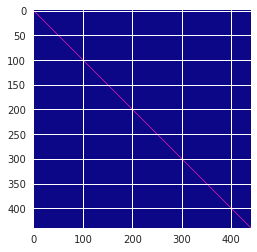

In [7]:
lorenz = LorenzWrapper(state_dimension)
lorenz.H = lambda x: x
lorenz.set_observations(nobs=n_obs, burn=500)
lorenz.n_total_obs = n_obs


def get_next_observations(x_init, lorenz=lorenz, modsigsq=0.5, obssigsq=3, n_obs=n_obs):
    lorenz.n_total_obs = n_obs
    n = lorenz.state_dimension
    truth = np.empty((n, n_obs + 1))
    curr_state = x_init
    truth[:, 0] = curr_state
    for i in range(n_obs):
        curr_state = lorenz.lorenz_model.integrate(0, curr_state, 1)[1][
            :, 1
        ] + modsigsq * np.random.normal(size=(n))
        truth[:, i + 1] = curr_state
    obs = truth + obssigsq * np.random.normal(size=(n, (n_obs + 1)))
    x_t = truth[:, -1]
    return obs, x_t, truth


print(f"Random observation operator   ---------------")
m = state_dimension * (n_obs + 1)

random_obs_operator = IdentityObservationOperator(m, m)  # , 0.9, 0)
# random_obs_operator = RandomObservationOperator(m, m, type="rect", p=0.5, p_offdiag=0.0001)

plt.imshow(random_obs_operator.H)
# m = n * (n_obs + 1)
l_model_randobs = create_lorenz_model_observation(
    lorenz, m, random_obs_operator, test=False
)


## Data assimilation setting

In [8]:
n_cycle = 50
n_outer = 5
n_inner = state_dimension
# np.random.set_state(7071522)

In [9]:
def extract_cond(DA):
    cond = []
    for ncy in range(n_cycle):
        for out in range(n_outer):
            cond.append(DA["inner_res_cycle"][ncy][out]["cond"])
            # print(ncy, out, c_)
    return cond


def extract_niter(DA):
    ite = []
    for ncy in range(n_cycle):
        for out in range(n_outer):
            ite.append(DA["inner_res_cycle"][ncy][out]["niter"])
            # print(ncy, out, c_)
    return ite


In [10]:
def pad_ragged(list_of_arr):
    max_len = 0
    for arr in list_of_arr:
        if len(arr) > max_len:
            max_len = len(arr)
    array = np.empty((len(list_of_arr), max_len))
    for i, arr in enumerate(list_of_arr):
        array[i, :] = np.pad(
            arr, (0, max_len - len(arr)), "constant", constant_values=(np.nan)
        )
    return array

def plot_residuals_inner_loop(DA, color, label, nostats=False):
    residuals = []
    for cy in DA["inner_res_cycle"]:
        for out in cy:
            residuals.append(np.sqrt((np.array(out["residuals"]) ** 2).sum(1)))
        plt.yscale("log")
    residuals = pad_ragged(residuals)
    iters = np.arange(residuals.shape[1])
    if nostats:
        for i, res in enumerate(residuals):
            plt.plot(res, color=plt.get_cmap('viridis')(i/len(residuals)))
    else:
        plt.plot(residuals.T, color=color, alpha=0.1)
        geom_mean = np.exp(np.nanmean(np.log(residuals), 0))
        sd = np.nanstd(np.log(residuals), 0)
        # plt.plot(residuals.T, color=color, alpha=0.1)
        plt.plot(geom_mean, lw=5, color=color, label=label)
        plt.plot(np.exp(np.log(geom_mean) - sd), ":", color=color)
        plt.plot(np.exp(np.log(geom_mean) + sd), ":", color=color)

        lregress = scipy.stats.linregress(iters, np.log(geom_mean))
        print(
            f"{label}: log(residuals) = {lregress.intercept:.2f} +  {lregress.slope:.2f} * i"
        )
        lregress = scipy.stats.linregress(iters[:20], np.log(geom_mean[:20]))
        print(
            f"First 20 it, {label}: log(residuals) = {lregress.intercept:.2f} +  {lregress.slope:.2f} * i"
        )
        plt.plot(
            iters[:20],
            np.exp(lregress.intercept + lregress.slope * iters[:20]),
            color="white",
            label="fitted line",
            linestyle="dashed",
            linewidth=0.75,
        )
    return residuals

In [11]:
lorenz.initial_state = lorenz.obs.reshape(-1, state_dimension)[-1, :]

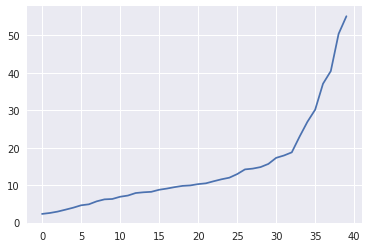

In [12]:
eigs = np.linalg.eigvals(l_model_randobs.gauss_newton_hessian_matrix(lorenz.initial_state))
plt.plot(np.sort(eigs))

### ML based preconditioner

In [13]:
def ML_preconditioner(x):
    return (
        inference_model(trained_model, torch.atleast_2d(torch.tensor(x, dtype=torch.float32)), full=False)
        .detach()
        .numpy()
        .squeeze()
    )


def inverse_ML_preconditioner(x):
    return (
        inv_inference_model(trained_model, torch.atleast_2d(torch.tensor(x, dtype=torch.float32)), full=False)
        .detach()
        .numpy()
        .squeeze()
    )    

def inverse_ML_preconditioner(x):
    return (
        trained_model.inverse_inference(torch.atleast_2d(
            torch.tensor(x, dtype=torch.float32)), shift=1.0, data_norm=renorm
        )
        .detach()
        .numpy()
        .squeeze()
    )

In [14]:
# import models
# ql = trained_model.layers(torch.Tensor(x).reshape(1, 41, 20)
# q = torch.linalg.qr(ql[0, :40, :])[0]
# l = ql[0, -1, :]
# H_ = models.construct_deflation(q.view(1, 40, 20), l.view(1, 20), torch.eye(40).view(1, 40, 40))

In [15]:
rint = np.random.randint(5)
x, forw, tlm = datamodule.val[rint]
H = ML_preconditioner(x.detach().numpy())
try:
    S, AS = trained_model.forward_AS(torch.Tensor(x).reshape(1, 40))
    (S**2).sum(axis=1).shape
except:
    pass

AttributeError: 'Model' object has no attribute 'inference'

In [ ]:
try:
    plt.imshow(trained_model.lowrank_linear_operator(torch.tensor(x, dtype=torch.float32).view(1, 40)).detach().numpy().squeeze() - np.eye(40))
    plt.colorbar()
except:
    pass

/tmp/ipykernel_552630/902911223.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(trained_model.lowrank_linear_operator(torch.tensor(x, dtype=torch.float32).view(1, 40)).detach().numpy().squeeze() - np.eye(40))


/usr/local/lib64/python3.8/site-packages/matplotlib/cbook/__init__.py:1369: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


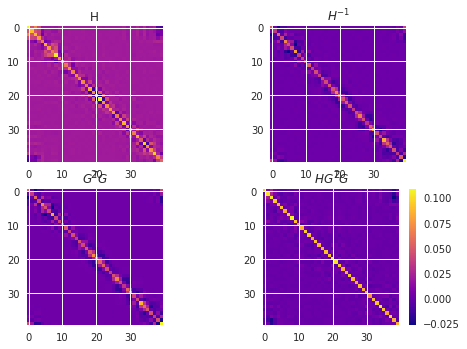

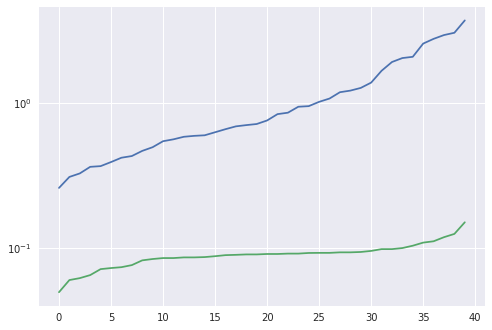

In [ ]:
rint = np.random.randint(5)
x, forw, tlm = datamodule.val[rint]

H = ML_preconditioner(x.detach().numpy())

plt.subplot(2, 2, 1)
plt.imshow(H)
plt.title('H')
plt.subplot(2, 2, 2)
plt.imshow(np.linalg.inv(H))
plt.title(r'$H^{-1}$')
plt.subplot(2, 2, 3)
plt.imshow(tlm.T @ tlm)
plt.title(r'$G^TG$')
plt.subplot(2, 2, 4)
plt.imshow(H @ tlm.detach().numpy().T @ tlm.detach().numpy())
plt.colorbar()
plt.title(r'$HG^TG$')
plt.figure()
eigs = np.sort(np.linalg.eigvals(tlm.T @ tlm))
plt.plot(eigs)
eigs_p = np.sort(np.linalg.eigvals(H @ tlm.detach().numpy().T @ tlm.detach().numpy()))
plt.plot(eigs_p)
plt.yscale('log')


In [ ]:
(torch.linalg.eigvalsh(torch.Tensor(H)))

tensor([0.0245, 0.0301, 0.0313, 0.0326, 0.0360, 0.0434, 0.0447, 0.0484, 0.0546,
        0.0658, 0.0712, 0.0714, 0.0744, 0.0789, 0.0832, 0.0845, 0.0884, 0.0896,
        0.0900, 0.0910, 0.1007, 0.1108, 0.1201, 0.1261, 0.1356, 0.1385, 0.1419,
        0.1481, 0.1546, 0.1580, 0.1822, 0.1870, 0.1983, 0.2093, 0.2185, 0.2506,
        0.3049, 0.3223, 0.4350, 0.4442])

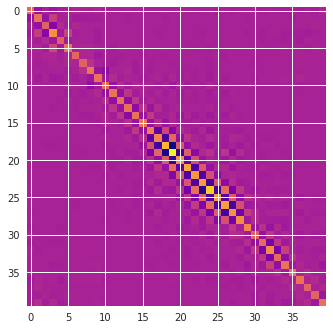

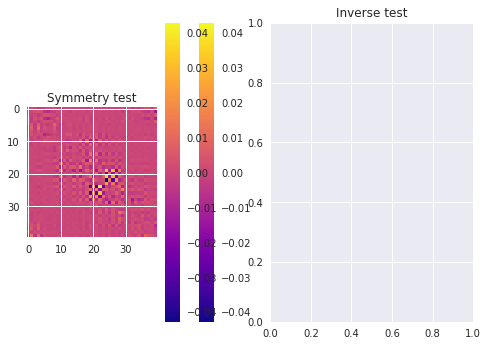

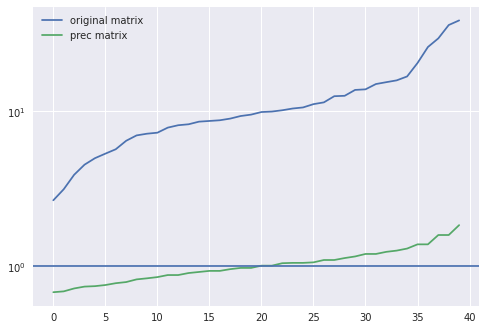

In [ ]:
H = ML_preconditioner(lorenz.initial_state)
# Hm1 = inverse_ML_preconditioner(lorenz.initial_state)


plt.imshow(H)
plt.figure()
plt.subplot(1, 2, 1)
plt.imshow(H - H.T)
plt.colorbar()
plt.title("Symmetry test")
plt.subplot(1, 2, 2)
# plt.imshow(H @ Hm1)
plt.title('Inverse test')
plt.colorbar()
plt.figure()
A = l_model_randobs.gauss_newton_hessian_matrix(lorenz.initial_state)
eigs, ev = np.linalg.eig(A)
plt.plot(np.sort(eigs), label='original matrix')
eigs_prec, ev_p = np.linalg.eig(H @ A)
plt.plot(np.sort(eigs_prec), label='prec matrix')
plt.axhline(1.0)
plt.legend()
plt.yscale('log')

In [ ]:
results = {"cond": np.empty(len(datamodule.val)), 
"cond_prec": np.empty(len(datamodule.val)),
"eigvals": np.empty((state_dimension, len(datamodule.val))),
"eigvals_prec": np.empty((state_dimension, len(datamodule.val)))}



for i, (x, forw, tlm) in enumerate(datamodule.val):
    H = ML_preconditioner(x.detach().numpy())
    # Hm1 = inverse_ML_preconditioner(x.detach().numpy())
    GtG = (tlm.T @ tlm).detach().numpy()
    results['cond'][i] = np.linalg.cond(GtG)
    results["eigvals"][:, i] = np.linalg.eigvals(GtG)
    prec_mat = H @ GtG
    results['cond_prec'][i] = np.linalg.cond(prec_mat)
    results["eigvals_prec"][:, i] = np.linalg.eigvals(prec_mat)


/tmp/ipykernel_3576785/2639802960.py:16: ComplexWarning: Casting complex values to real discards the imaginary part
  results["eigvals_prec"][:, i] = np.linalg.eigvals(prec_mat)


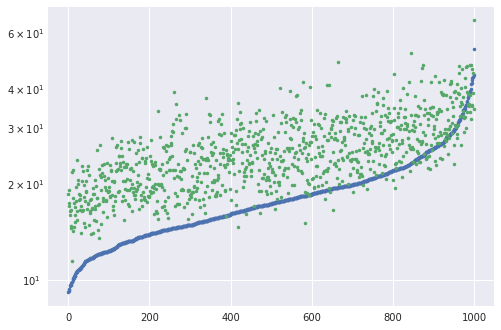

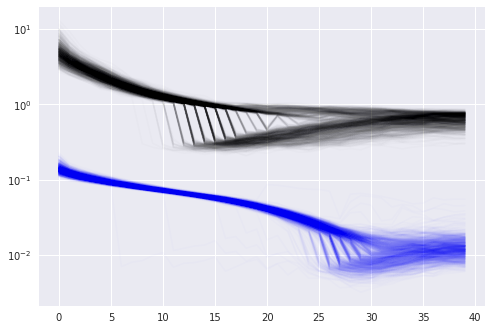

In [ ]:
idx = np.argsort(results['cond'])
plt.plot(results['cond'][idx], '.')
plt.plot(results["cond_prec"][idx], '.')
plt.yscale('log')
plt.figure()
plt.plot(np.sort(results["eigvals"]), 'k', alpha = 0.01)
plt.plot(np.sort(results["eigvals_prec"]), 'b', alpha = 0.01)

plt.yscale('log')


In [ ]:
rng = np.random.seed(seed=93)
DA_ML = data_assimilation(
    l_model_randobs,
    random_obs_operator,
    lorenz.initial_state,
    get_next_observations,
    n_cycle,
    n_outer,
    n_inner,
    prec={"prec_name": ML_preconditioner, "side": "right"},
    plot=False,
)
# diagnostic_plots(DA_ML, "ML")
with open(f"{ray_folder}/{model_name}/{model_name}_DA.pkl", 'wb') as pklfile:
    del DA_ML['l_model']
    pickle.dump(DA_ML, pklfile)

niter,     f(x),  CG iter, log-det,   cond
    0, 1811.6086,       21,  92.30, 1.6819e+01
    1, 1739.9323,       19,  92.28, 1.6722e+01
    2, 1738.6239,       16,  92.30, 1.6911e+01
    3, 1738.5901,       15,  92.30, 1.6874e+01
    4, 1738.5884,       15,  92.30, 1.6879e+01
niter,     f(x),  CG iter, log-det,   cond
    0, 1771.1649,       25,  92.75, 2.2617e+01
    1, 1704.4772,       22,  92.94, 2.3866e+01
    2, 1702.7138,       24,  92.98, 2.4321e+01
    3, 1702.6782,       21,  92.99, 2.4366e+01
    4, 1702.6774,       18,  92.99, 2.4375e+01
niter,     f(x),  CG iter, log-det,   cond
    0, 2087.3659,       21,  93.04, 1.9480e+01
    1, 2048.0537,       21,  93.20, 2.3854e+01
    2, 2047.3616,       21,  93.22, 2.4048e+01
    3, 2047.3491,       19,  93.22, 2.4095e+01
    4, 2047.3488,       16,  93.22, 2.4098e+01
niter,     f(x),  CG iter, log-det,   cond
    0, 1813.8635,       23,  93.57, 2.1703e+01
    1, 1766.7946,       24,  93.67, 2.1726e+01
    2, 1763.7601,       21,  

In [ ]:
DA_ML

{'truth_full': array([[ 0.6119107 ,  0.42951288,  0.51991936, ..., -6.6729438 ,
         -7.81885574, -7.86299735],
        [ 0.25509262,  0.44703182,  0.59728242, ...,  1.93514031,
          1.3433846 ,  0.11575646],
        [ 1.85473502,  1.38677853,  2.21796957, ...,  5.93713092,
          6.07173848,  6.44308253],
        ...,
        [ 0.7205757 ,  0.30453292,  0.73615808, ..., -3.00017329,
         -3.35744468, -4.20850831],
        [ 0.2816627 ,  0.89510596,  0.76801443, ...,  5.54805136,
          5.40253795,  5.40460602],
        [-1.38126643, -1.30457324, -1.24288528, ...,  0.85610588,
          1.39695037,  2.29826171]]),
 'analysis_full': array([[-1.91427108, -1.69798307, -1.48576883, ..., -6.00092223,
         -5.83131734, -5.6762773 ],
        [ 0.27239167,  0.32072729,  0.380596  , ...,  0.56522138,
          0.03070364, -0.49441824],
        [ 1.53234115,  1.68319374,  1.83480183, ...,  7.0573921 ,
          7.1388578 ,  7.11293612],
        ...,
        [-0.44845718, -

Text(0.5, 0, 'Inner iteration (outer*cycle cumulated)')

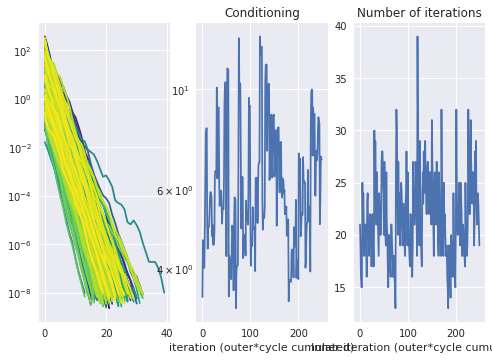

In [ ]:
plt.subplot(1, 3, 1)
plot_residuals_inner_loop(DA_ML, 'blue', label='ML', nostats=True)
conds = extract_cond(DA_ML)
plt.subplot(1, 3, 2)
plt.plot(conds)
plt.title("Conditioning")
plt.xlabel("iteration (outer*cycle cumulated)")
plt.yscale('log')
plt.subplot(1, 3, 3)
niters = extract_niter(DA_ML)
plt.plot(niters)
plt.title("Number of iterations")
plt.xlabel("Inner iteration (outer*cycle cumulated)")


### Vanilla Inner Loop

In [ ]:
rng = np.random.seed(seed=93)
DA_vanilla = data_assimilation(
    l_model_randobs,
    random_obs_operator,
    lorenz.initial_state,
    get_next_observations,
    n_cycle,
    n_outer,
    n_inner,
    prec=None,
    plot=False,
)
# diagnostic_plots(DA_vanilla, "vanilla")
with open(f"{state_dimension}_DA.pkl", 'wb') as pklfile:
    del DA_vanilla['l_model']
    pickle.dump(DA_vanilla, pklfile)

niter,     f(x),  CG iter, log-det,   cond
    0, 1811.6086,       28,  92.30, 1.6819e+01
    1, 1739.9323,       26,  92.28, 1.6722e+01
    2, 1738.6239,       25,  92.30, 1.6911e+01
    3, 1738.5901,       24,  92.30, 1.6874e+01
    4, 1738.5884,       22,  92.30, 1.6879e+01
niter,     f(x),  CG iter, log-det,   cond
    0, 1771.1649,       29,  92.75, 2.2617e+01
    1, 1704.4772,       28,  92.94, 2.3866e+01
    2, 1702.7138,       27,  92.98, 2.4321e+01
    3, 1702.6782,       25,  92.99, 2.4366e+01
    4, 1702.6774,       25,  92.99, 2.4375e+01
niter,     f(x),  CG iter, log-det,   cond
    0, 2087.3659,       32,  93.04, 1.9480e+01
    1, 2048.0537,       28,  93.20, 2.3854e+01
    2, 2047.3616,       27,  93.22, 2.4048e+01
    3, 2047.3491,       25,  93.22, 2.4095e+01
    4, 2047.3488,       23,  93.22, 2.4098e+01
niter,     f(x),  CG iter, log-det,   cond
    0, 1813.8635,       31,  93.57, 2.1703e+01
    1, 1766.7946,       30,  93.67, 2.1726e+01
    2, 1763.7601,       28,  

Text(0.5, 0, 'Inner iteration (outer*cycle cumulated)')

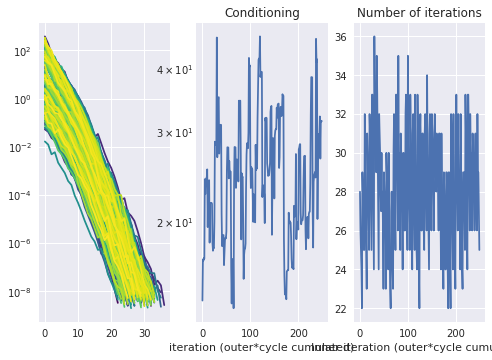

In [ ]:
plt.subplot(1, 3, 1)
plot_residuals_inner_loop(DA_vanilla, 'blue', label='ML', nostats=True)
conds = extract_cond(DA_vanilla)
plt.subplot(1, 3, 2)
plt.plot(conds)
plt.title("Conditioning")
plt.xlabel("iteration (outer*cycle cumulated)")
plt.yscale('log')
plt.subplot(1, 3, 3)
niters = extract_niter(DA_vanilla)
plt.plot(niters)
plt.title("Number of iterations")
plt.xlabel("Inner iteration (outer*cycle cumulated)")


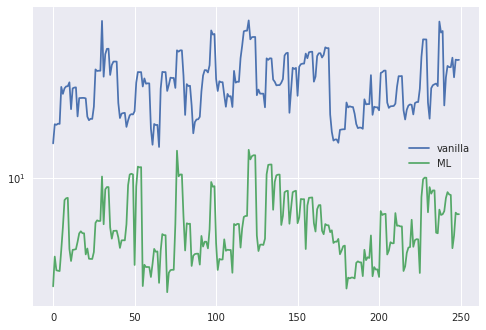

In [ ]:
conds_va = extract_cond(DA_vanilla)
conds_ml = extract_cond(DA_ML)
plt.plot(conds_va, label="vanilla")
plt.plot(conds_ml, label='ML')
plt.yscale('log')
plt.legend()

### Fixed LMP

In [ ]:
# with open('/da_dev/GNlearning/data/POD_40.npy', 'rb') as f:
#     eigvecs = np.load(f)

# def fixed_LMP_preconditioner(x, GtG):
#     return construct_LMP(state_dimension, eigvecs[:, :30], GtG @ eigvecs[:, :30])

# rng = np.random.seed(seed=93)
# DA_eof = data_assimilation(
#     l_model_randobs,
#     random_obs_operator,
#     get_next_observations,
#     n_cycle,
#     n_outer,
#     n_inner,
#     prec=fixed_LMP_preconditioner,
#     plot=False,
# )
# diagnostic_plots(DA_eof, "EOF")

### Spectral LMP

In [ ]:
rng = np.random.seed(seed=93)
l_model_randobs.r = rank
DA_LMP = data_assimilation(
    l_model_randobs,
    random_obs_operator,
    lorenz.initial_state,
    get_next_observations,
    n_cycle,
    n_outer,
    n_inner,
    prec="spectralLMP",
    plot=False,
)
# diagnostic_plots(DA_LMP, "LMP")
with open(f"spectral_LMP/{state_dimension}_{rank}_DA.pkl", 'wb') as pklfile:
    del DA_LMP['l_model']
    pickle.dump(DA_LMP, pklfile)

niter,     f(x),  CG iter, log-det,   cond
    0, 1811.6086,       15,  92.30, 1.6819e+01
    1, 1739.9323,       14,  92.28, 1.6722e+01
    2, 1738.6239,       13,  92.30, 1.6911e+01
    3, 1738.5901,       12,  92.30, 1.6874e+01
    4, 1738.5884,       11,  92.30, 1.6879e+01
niter,     f(x),  CG iter, log-det,   cond
    0, 1771.1649,       15,  92.75, 2.2617e+01
    1, 1704.4772,       14,  92.94, 2.3866e+01
    2, 1702.7138,       13,  92.98, 2.4321e+01
    3, 1702.6782,       12,  92.99, 2.4366e+01
    4, 1702.6774,       11,  92.99, 2.4375e+01
niter,     f(x),  CG iter, log-det,   cond
    0, 2087.3659,       17,  93.04, 1.9480e+01
    1, 2048.0537,       16,  93.20, 2.3854e+01
    2, 2047.3616,       14,  93.22, 2.4048e+01
    3, 2047.3491,       14,  93.22, 2.4095e+01
    4, 2047.3488,       12,  93.22, 2.4098e+01
niter,     f(x),  CG iter, log-det,   cond
    0, 1813.8635,       18,  93.57, 2.1703e+01
    1, 1766.7946,       16,  93.67, 2.1726e+01
    2, 1763.7601,       15,  

## Diagnostics

vanilla: log(residuals) = 2.05 +  -0.65 * i
First 20 it, vanilla: log(residuals) = 2.40 +  -0.67 * i
LMP, r=20: log(residuals) = 1.69 +  -1.28 * i
First 20 it, LMP, r=20: log(residuals) = 1.69 +  -1.28 * i
ML, r=20: log(residuals) = -2.81 +  -0.47 * i
First 20 it, ML, r=20: log(residuals) = 1.52 +  -0.92 * i


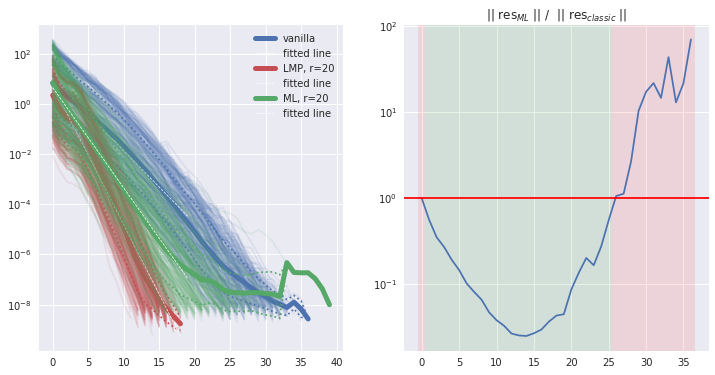

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
residuals = {}
residuals["vanilla"] = plot_residuals_inner_loop(
    DA_vanilla, sns.color_palette()[0], "vanilla"
)
residuals["LMP"] = plot_residuals_inner_loop(
    DA_LMP, sns.color_palette()[2], f"LMP, r={rank}"
)

residuals["ML"] = plot_residuals_inner_loop(
    DA_ML, sns.color_palette()[1], f"ML, r={rank}"
)
plt.legend()

n_it_max = min(
    [len(np.nanmean(residuals["vanilla"], 0)), len(np.nanmean(residuals["ML"], 0))]
)

ratio = (
    np.nanmean(residuals["ML"], 0)[:n_it_max]
    / np.nanmean(residuals["vanilla"], 0)[:n_it_max]
)
plt.subplot(1, 2, 2)
plt.plot(ratio)
for i, r in enumerate(ratio):
    if r < 1.0:
        plt.axvspan(i - 0.5, i + 0.5, facecolor="green", alpha=0.1)
    else:
        plt.axvspan(i - 0.5, i + 0.5, facecolor="red", alpha=0.1)

# plt.axhspan(1, 12, facecolor='red', alpha=0.1)
plt.title(r"|| res${}_{ML}$ || /  || res${}_{classic}$ ||")
plt.axhline(y=1, color="red")
plt.yscale("log")


plt.savefig(f"figures/{ray_folder}/{model_name}_rate_cv_inner_loop.png")

# plot_innerloopiter(DA_vanilla, "blue", "vanilla")
# plot_innerloopiter(DA_ML, "red", "ML")
# plot_innerloopiter(DA_LMP, "green", "LMP")


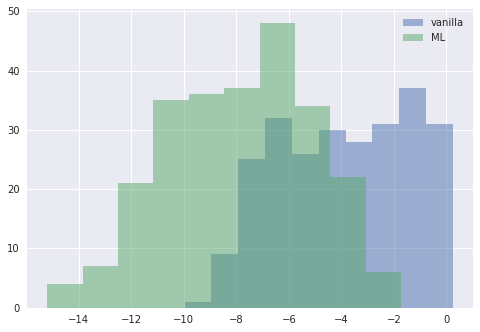

In [ ]:
for j, it in enumerate([5, 10, 20]):
    plt.subplot(1, 3, j+1)
    plt.hist(np.log(residuals['vanilla'][:, 10]), alpha=0.5, label='vanilla')
    plt.hist(np.log(residuals['ML'][:, 10]), alpha=0.5, label='ML')
    plt.hist(np.log(residuals['ML'][:, 10]), alpha=0.5, label='ML')
    plt.title(f"{it}th iteration")
    plt.legend()
plt.suptitle(f'Distribution of residual error (in log scale)')

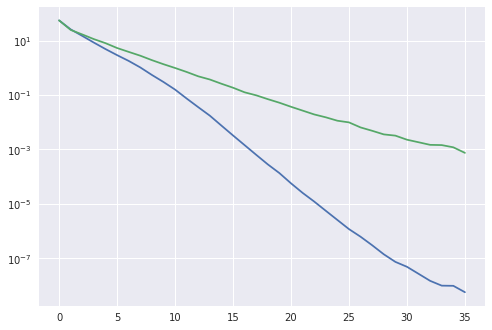

In [ ]:
plt.plot(np.nanmean(residuals["vanilla"], 0)[:n_it_max])
plt.plot(np.nanmean(residuals["ML"], 0)[:n_it_max])
plt.yscale('log')

In [ ]:
rms_analysis = []
for DA in [DA_vanilla, DA_ML]:
    rms_analysis.append(((DA["analysis_full"] - DA["truth_full"]) ** 2).mean(0))


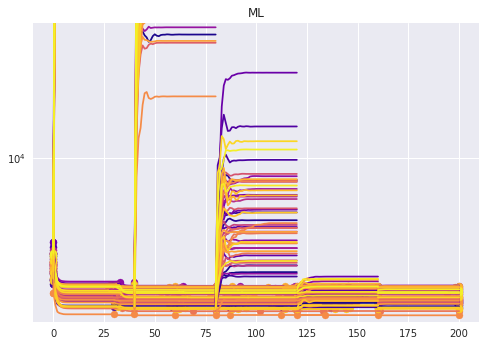

In [ ]:
plot_quadratic_function(DA_vanilla, n_cycle, "vanilla")
plot_quadratic_function(DA_ML, n_cycle, "ML")
plt.yscale("log")


In [ ]:
print("ML", sum(DA_ML["n_iter_innerloop"]).sum() / (n_outer * n_cycle))
print("vanilla", sum(DA_vanilla["n_iter_innerloop"]).sum() / (n_outer * n_cycle))
print("LMP", sum(DA_LMP["n_iter_innerloop"]).sum() / (n_outer * n_cycle))


ML 39.952
vanilla 28.228
LMP 14.64


In [ ]:
if "diag_dict" not in locals():
    diag_dict = {}
    diag_dict["cond"] = {}
    diag_dict["niter"] = {}
    # diag_dict['residuals'] = {}

for ke, DA in zip([f"vanilla", f"LMP", f"ML"], [DA_vanilla, DA_LMP, DA_ML]):
    try:
        diag_dict["cond"][f"{ke}"][f"{rank}"] = extract_cond(DA)
        diag_dict["niter"][f"{ke}"][f"{rank}"] = extract_niter(DA)
    except KeyError:
        diag_dict["cond"][f"{ke}"] = {}
        diag_dict["niter"][f"{ke}"] = {}
        diag_dict["cond"][f"{ke}"][f"{rank}"] = extract_cond(DA)
        diag_dict["niter"][f"{ke}"][f"{rank}"] = extract_niter(DA)
    # diag_dict['residuals'][f"{ke}"][f"{rank}"] = residuals[ke]


In [ ]:
# for rk in [20]:
#     df = pd.DataFrame(diag_dict['cond']).T
#     df = df.explode(str(rk))
#     df['rank'] = rk
#     df['method'] = df.index
#     df.columns = ['cond', 'rank', 'method']
# df

# import pickle
# with open('DA_dict_diagnostics.pkl', 'wb') as f:
#     pickle.dump(tot_diag_dict, f)


In [ ]:
# import pickle

# with open("DA_dict_diagnostics.pkl", "rb") as f:
#     tot_diag_dict = pickle.load(f)

# for var in ["cond", "niter"]:
#     for mod in ["vanilla", "LMP", "ML"]:
#         print(var, mod)
#         tot_diag_dict[var][mod][str(rank)] = {}
#         tot_diag_dict[var][mod][str(rank)] = diag_dict[var][mod][str(rank)]


In [ ]:
# def create_df(key, dict):
#     df = pd.DataFrame()
#     rks = list(dict[key]["vanilla"].keys())
#     print(rks)
#     rks.sort(key=lambda x: int(x))
#     for rk in rks:
#         _df = pd.DataFrame(pd.DataFrame(dict[key]).T[str(rk)])
#         _df = _df.explode(str(rk))
#         _df["rank"] = rk
#         _df["method"] = _df.index
#         _df.columns = [key, "rank", "method"]
#         df = df.append(_df)
#     return df


In [ ]:
# plt.subplot(1, 2, 1)
# df_cond = create_df("cond", tot_diag_dict)
# sns.boxplot(data=df_cond, y="method", x="cond", hue="rank", orient="h")
# plt.subplot(1, 2, 2)
# df_iter = create_df("niter", tot_diag_dict)
# sns.boxplot(data=df_iter, y="method", x="niter", hue="rank", orient="h")
